In [1]:
import pandas as pd
import numpy as np
import gandula
import matplotlib.pyplot as plt

# Carregar os Dados

In [2]:
events = pd.read_parquet('dados/eventos_sem_generic.parquet')

# Limpeza de Dados

- Ataques da esquerda para direita

In [ ]:
events_standardized = events.copy()

#Iteramos sobre cada partida única.
for match in events_standardized['match_id'].unique():
    match_events = events_standardized[events_standardized['match_id'] == match]
    
    # Identificar os 2 times
    teams_in_match = match_events['team_id'].unique()
    
    #Iteramos sobre cada período da partida
    for period in match_events['period_id'].unique():
        #Filtramos para encontrar o evento de KICK_OFF do período atual.
        kick_off_event = match_events[
            (match_events['period_id'] == period) &
            (match_events['set_piece_type'] == 'KICK_OFF')
        ]
        
        #Se não houver um kick-off registrado para este período, pulamos para o próximo.
        if kick_off_event.empty:
            continue
            
        #Pegamos as informações do evento de kick-off.
        kicking_team = kick_off_event['team_id'].iloc[0]
        kick_off_end_x = kick_off_event['end_coordinates_x'].iloc[0]
        
        team_to_flip = None
        
        #Aplicamos a sua regra para decidir qual time "espelhar".
        if kick_off_end_x > 0.5:
            team_to_flip = kicking_team
        else:
            # O time que chutou atacava para a direita (L-R).
            other_team = teams_in_match[teams_in_match != kicking_team][0]
            team_to_flip = other_team

        #Aplicar a transformação no time identificado.
        if team_to_flip is not None:
            #Criamos um filtro para selecionar todas as linhas do time que precisa ser espelhado
            rows_to_flip = (
                (events_standardized['match_id'] == match) &
                (events_standardized['period_id'] == period) &
                (events_standardized['team_id'] == team_to_flip)
            )
     
            coord_cols = ['coordinates_x', 'coordinates_y', 'end_coordinates_x', 'end_coordinates_y']
            events_standardized.loc[rows_to_flip, coord_cols] = 1 - events_standardized.loc[rows_to_flip, coord_cols]

print("Padronização concluída com sucesso!")

Padronização concluída com sucesso!


- Checar se funcionou:

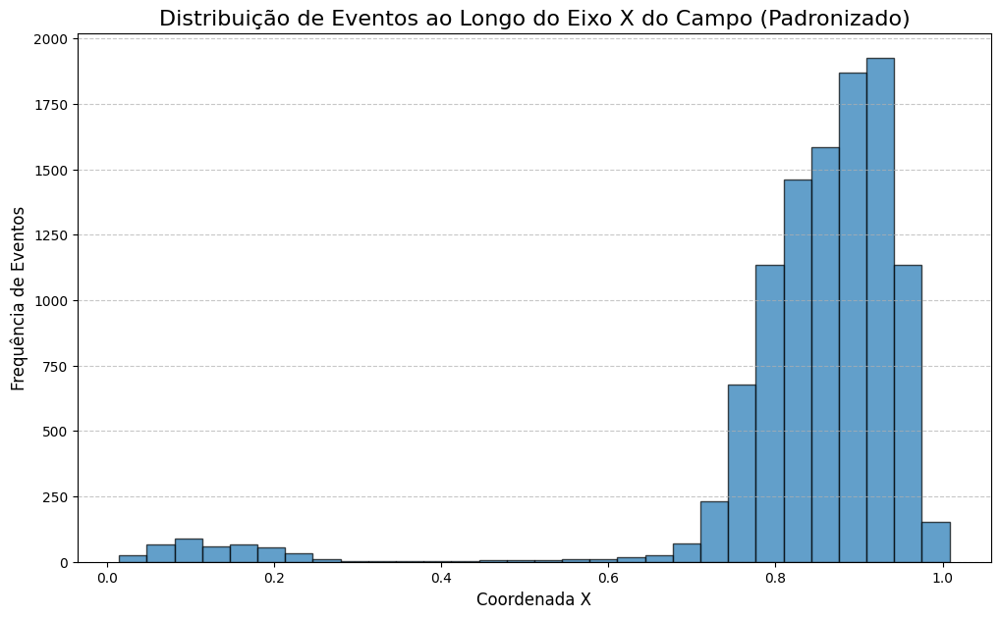

In [ ]:
chutes = events_standardized[events_standardized['event_type'] == 'SHOT']
x_coords = chutes['coordinates_x'].dropna()

plt.figure(figsize=(12, 7))
plt.hist(x_coords, bins=30, edgecolor='black', alpha=0.7)
plt.title('Distribuição de Eventos ao Longo do Eixo X do Campo', fontsize=16)
plt.xlabel('Coordenada X', fontsize=12)
plt.ylabel('Frequência de Eventos', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

- Arrumar o tempo

In [ ]:
#transformar o tempo em string
events_standardized['timestamp_td'] = pd.to_timedelta(events_standardized['timestamp'])

#encontrar o tempo mínimo para cada partida
tempo_inicial_por_partida = events_standardized.groupby('match_id')['timestamp_td'].transform('min')

# calcular o tempo normalizado em segundos para cada evento de acordo com o inicio de cada paartida
events_standardized['time_sec_norm'] = (events_standardized['timestamp_td'] - tempo_inicial_por_partida).dt.total_seconds()

# Filtrar de Fato

- Selecionar os Duelos com sucesso no campo defensivo

In [6]:
#steals = events_standardized[(events_standardized['event_type'] == 'DUEL') & (events_standardized['success'] == 1)]

- Selecionar no campo defensivo

In [7]:
#steals_def = steals[steals['coordinates_x'] < 0.5 ]

In [ ]:
duels_defensivos = events_standardized[
    (events_standardized['event_type'] == 'DUEL') &
    (events_standardized['success'] == 1) &
    (events_standardized['coordinates_x'] < 0.5)
]

# identifica recuperacao de bola apos um passe errado do adversario .
is_recovery_after_pass = (
    (events_standardized['event_type'].shift(1) == 'PASS') &
    (events_standardized['success'].shift(1) == 0) &
    (events_standardized['coordinates_x'] < 0.5) &
    (events_standardized['team_id'] != events_standardized['team_id'].shift(1))
)
recoveries_after_pass = events_standardized[is_recovery_after_pass]

# filtra pra ver se elas comecam na defesa 
recoveries_defensivas = recoveries_after_pass[recoveries_after_pass['coordinates_x'] < 0.5]

#'defensive_recoveries' contém todos os inicios de contra-ataque.
defensive_recoveries = pd.concat([duels_defensivos, recoveries_defensivas])


- Pegar todos os eventos em que o time que roubou a bola manteve a posse de bola

In [ ]:
#df auxiliar
events_cleaned = events_standardized[~((events_standardized['event_type'] == 'DUEL') & (events_standardized['success'] == 0))].copy()

In [10]:
break_conditions = (
    (events_cleaned['ball_owning_team'] != events_cleaned['ball_owning_team'].shift(1)) |
    (events_cleaned['set_piece_type'].notna()) |
    (events_cleaned['period_id'] != events_cleaned['period_id'].shift(1)) |
    (events_cleaned['match_id'] != events_cleaned['match_id'].shift(1))
)
events_cleaned['sequence_id'] = break_conditions.cumsum()

#Marca as linhas que são as roubadas de bola
events_cleaned['is_ca_start'] = events_cleaned.index.isin(defensive_recoveries.index)

#Identifica as sequências que contêm uma roubada de bola
is_ca_sequence = events_cleaned.groupby('sequence_id')['is_ca_start'].transform('first')

#Filtra para manter apenas o corpo principal dessas sequências
counter_attack_sequences = events_cleaned[is_ca_sequence].copy()

print(f"Sequências principais identificadas. Total de {counter_attack_sequences['sequence_id'].nunique()} sequências.")

Sequências principais identificadas. Total de 37047 sequências.


In [11]:
#Pega os IDs únicos das sequências que nos interessam.
post_steal_ids = counter_attack_sequences['sequence_id'].unique()

#Os eventos de perda de posse estarão na sequência seguinte (ID + 1).
turnover_sequence_ids = post_steal_ids + 1

#Filtra o DataFrame original para encontrar todas as sequências de "turnover".
turnover_sequences_full = events_cleaned[events_cleaned['sequence_id'].isin(turnover_sequence_ids)]

#De cada uma dessas sequências de turnover, pegamos apenas o primeiro evento.
turnover_events = turnover_sequences_full.groupby('sequence_id').head(1).copy()

turnover_events['sequence_id'] = turnover_events['sequence_id'] - 1

print(f"Eventos de perda de posse identificados e IDs corrigidos. Total de {len(turnover_events)} eventos.")

Eventos de perda de posse identificados e IDs corrigidos. Total de 37047 eventos.


In [12]:
#Concatena o corpo das sequências com os seus respectivos eventos de finalização.
final_sequences_df = pd.concat([counter_attack_sequences, turnover_events])

#Ordena o DataFrame final pelo timestamp para garantir a ordem cronológica correta dos eventos.
final_sequences_df.sort_values(by=['match_id', 'period_id', 'time_sec_norm'], inplace=True)

#Renomeia a coluna de ID para clareza
final_sequences_df.rename(columns={'sequence_id': 'possession_id'}, inplace=True)

print(f"\nMontagem finalizada! DataFrame final criado com {len(final_sequences_df)} eventos.")
print("\nAmostra do DataFrame final (observe como a última linha de uma posse pode ser de outro time):")

#Para visualizar uma sequência completa e seu fim:
if not final_sequences_df.empty:
    #Pega o ID da primeira posse para exemplificar
    example_id = final_sequences_df['possession_id'].iloc[0]
    print(final_sequences_df[final_sequences_df['possession_id'] == example_id][['time_sec_norm', 'ball_owning_team', 'event_type']])


Montagem finalizada! DataFrame final criado com 181515 eventos.

Amostra do DataFrame final (observe como a última linha de uma posse pode ser de outro time):
       time_sec_norm ball_owning_team event_type
index                                           
4              5.973               11       DUEL
6              6.006               11  CLEARANCE
7              8.876                5       PASS


In [13]:
final_sequences_df['match_id'].value_counts()

match_id
13652    692
13463    671
13489    666
13474    663
13470    657
        ... 
13664    308
13495    303
13469    284
13578    232
13660    205
Name: count, Length: 380, dtype: int64

- Carregar os dados de tracking

In [14]:
tracking_players13520 = pd.read_parquet('dados/parquet/13520_players.parquet')
tracking_metadata13520 = pd.read_parquet('dados/parquet/13520_metadata.parquet')

- Sincronizar o tempo do tracking com o de evento

In [ ]:
def ajustar_tempo_continuo(df_tracking, df_events):
  """
  Ajusta o tempo em um DataFrame de tracking para que seja contínuo entre
  o primeiro e o segundo tempo, usando um DataFrame de eventos como referência.
  """
  #cal o tempo de inicio para cada partida
  inicio_2t_por_partida = df_events[df_events['period_id'] == 2].groupby('match_id')['time_sec_norm'].min()

  #Mapear esses valores para o DataFrame de tracking.
  df_tracking['inicio_2T_mestre'] = df_tracking['match_id'].map(inicio_2t_por_partida)

  #Criar a coluna de tempo contínuo.
  df_tracking['elapsed_seconds_cont'] = np.where(
      df_tracking['period'] == 2,
      df_tracking['elapsed_seconds'] + df_tracking['inicio_2T_mestre'],
      df_tracking['elapsed_seconds']
  )

  df_tracking = df_tracking.drop(columns=['inicio_2T_mestre'])

  return df_tracking

In [16]:
tracking_players13520 = ajustar_tempo_continuo(tracking_players13520, events_standardized)
tracking_metadata13520 = ajustar_tempo_continuo(tracking_metadata13520, events_standardized)

- Selecionar apenas os eventos de uma partida

In [17]:
sequences13520 = final_sequences_df[final_sequences_df['match_id'] == '13520']

- Fazer o sinc entre sequences e metadata

In [20]:
sequences_tra = []

for possession_id, group in sequences13520.groupby('possession_id'):
    start_time = round(group['time_sec_norm'].min(), 3)
    end_time = round(group['time_sec_norm'].max(), 3)

    tracking_metadata13520['elapsed_seconds_cont'] = tracking_metadata13520['elapsed_seconds_cont'].round(3)


    frames_in_sequence = tracking_metadata13520[
        (tracking_metadata13520['elapsed_seconds_cont'] >= start_time) &
        (tracking_metadata13520['elapsed_seconds_cont'] <= end_time)
    ]

    sequences_tra.append({
        'possession_id': possession_id,
        'start_time': start_time,
        'end_time': end_time,
        'frames': frames_in_sequence
    })

all_frames = [] 

for seq in sequences_tra:
    df = seq['frames'].copy()
    df['possession_id'] = seq['possession_id']
    all_frames.append(df)

#ta no df 
frames_df = pd.concat(all_frames, ignore_index=True)

- Fazer o sinc entre metadata e players

In [21]:
frame_ids_de_interesse = frames_df['frame_id'].unique()

In [22]:
filtered_players_df = tracking_players13520[tracking_players13520['frame_id'].isin(frame_ids_de_interesse)]
filtered_players_df['elapsed_seconds_cont'] = filtered_players_df['elapsed_seconds_cont'].round(3)

/tmp/ipykernel_26186/2487295504.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_players_df['elapsed_seconds_cont'] = filtered_players_df['elapsed_seconds_cont'].round(3)


In [23]:
metadata_cols = ['frame_id', 'match_id', 'period', 'possession_id', 'elapsed_seconds_cont']

tracking_full = pd.merge(
    filtered_players_df,
    frames_df[metadata_cols],
    on=['frame_id', 'match_id', 'period', 'elapsed_seconds_cont']
)

tracking_full = tracking_full.drop(columns=['elapsed_seconds'], errors='ignore')

In [24]:
start_x_tracking = tracking_full.groupby('possession_id')['ball_x'].transform('first')
end_x_tracking = tracking_full.groupby('possession_id')['ball_x'].transform('last')
start_t_tracking = tracking_full.groupby('possession_id')['elapsed_seconds_cont'].transform('first')
end_t_tracking = tracking_full.groupby('possession_id')['elapsed_seconds_cont'].transform('last')

tracking_full['tracking_forward_dist'] = end_x_tracking - start_x_tracking
tracking_full['tracking_duration'] = end_t_tracking - start_t_tracking

#Calcula a velocidade de avanço.
tracking_full['tracking_velocity'] = 0.0
mask = tracking_full['tracking_duration'] > 0
tracking_full.loc[mask, 'tracking_velocity'] = \
    tracking_full['tracking_forward_dist'] / tracking_full['tracking_duration']

mask_ca = (
    (tracking_full['tracking_forward_dist'] >= 10) &
    (tracking_full['tracking_velocity'] >= 4)
)
valid_counter_attack_ids = tracking_full[mask_ca]['possession_id'].unique()
print(f"Validação concluída: {len(valid_counter_attack_ids)} sequências são contra-ataques.")


Validação concluída: 5 sequências são contra-ataques.


In [25]:
#Eventos de Contra Atque
counter_attack_event = final_sequences_df[final_sequences_df['possession_id'].isin(valid_counter_attack_ids)].copy()

#Metadata de Contra Ataque
counter_attack_metadata = sequences13520[sequences13520['possession_id'].isin(valid_counter_attack_ids)].copy()

#Tracking de Contra Ataque
counter_attack_tracking = tracking_full[tracking_full['possession_id'].isin(valid_counter_attack_ids)].copy()

In [ ]:
counter_attack_tracking.columns

Index(['frame_id', 'match_id', 'period', 'shirt', 'x', 'y', 'team', 'ball_x',
       'ball_y', 'ball_z', 'ball_vx', 'ball_vy', 'ball_vz', 'ball_speed',
       'ball_ax', 'ball_ay', 'ball_az', 'vx', 'vy', 'ax', 'ay', 'speed',
       'elapsed_seconds_cont', 'possession_id', 'tracking_forward_dist',
       'tracking_duration', 'tracking_velocity'],
      dtype='object')

In [ ]:
counter_attack_metadata.columns

Index(['event_id', 'event_type', 'period_id', 'timestamp', 'end_timestamp',
       'ball_state', 'ball_owning_team', 'team_id', 'player_id',
       'coordinates_x', 'coordinates_y', 'end_coordinates_x',
       'end_coordinates_y', 'receiver_player_id', 'body_part_type',
       'set_piece_type', 'pass_type', 'result', 'success', 'duel_type',
       'goalkeeper_type', 'card_type', 'match_id', 'timestamp_td',
       'time_sec_norm', 'possession_id', 'is_defensive_steal'],
      dtype='object')

# Visualizar um contra ataque

In [ ]:
from matplotlib.animation import FuncAnimation
from matplotlib.gridspec import GridSpec
from IPython.display import HTML

#trocar de acordo com a partida
id_para_animar = 78110 

animation_data = counter_attack_tracking[counter_attack_tracking['possession_id'] == id_para_animar]
frame_ids_anim = sorted(animation_data['frame_id'].unique())

if not frame_ids_anim:
    print("Nenhum frame encontrado para o ID de posse fornecido.")
else:
    # campo
    field_length = 105
    field_width = 68

    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(1, 1, 1)

  
    def setup_pitch(ax):
        ax.set_facecolor("#228B22")
        ax.set_xlim(-field_length/2, field_length/2)
        ax.set_ylim(-field_width/2, field_width/2)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect('equal')
        ax.plot([0, 0], [-field_width/2, field_width/2], color='white', lw=2) 
        ax.add_patch(plt.Circle((0, 0), 9.15, color='white', fill=False, lw=2))      
        ax.plot([field_length/2 - 16.5, field_length/2], [-20.16, -20.16], color='white', lw=2)
        ax.plot([field_length/2 - 16.5, field_length/2], [20.16, 20.16], color='white', lw=2)
        ax.plot([field_length/2 - 16.5, field_length/2 - 16.5], [-20.16, 20.16], color='white', lw=2)
        ax.plot([-field_length/2, -field_length/2 + 16.5], [-20.16, -20.16], color='white', lw=2)
        ax.plot([-field_length/2, -field_length/2 + 16.5], [20.16, 20.16], color='white', lw=2)
        ax.plot([-field_length/2 + 16.5, -field_length/2 + 16.5], [-20.16, 20.16], color='white', lw=2)


    setup_pitch(ax)

    scat_home = ax.scatter([], [], c='red', s=150, edgecolors='black')
    scat_away = ax.scatter([], [], c='blue', s=150, edgecolors='black')
    scat_ball = ax.scatter([], [], c='white', s=80, edgecolors='black', zorder=10)
    title = ax.text(0.5, 1.02, '', transform=ax.transAxes, ha='center', color='black', fontsize=14)

    def update(frame_idx):
        fid = frame_ids_anim[frame_idx]
        data = animation_data[animation_data['frame_id'] == fid]
        
        home = data[data['team'] == 'home']
        away = data[data['team'] == 'away']
        scat_home.set_offsets(np.column_stack((home['x'], home['y'])))
        scat_away.set_offsets(np.column_stack((away['x'], away['y'])))
        
        ball_x, ball_y = data['ball_x'].iloc[0], data['ball_y'].iloc[0]
        scat_ball.set_offsets((ball_x, ball_y))
        
        title.set_text(f"Contra-Ataque ID: {id_para_animar} | Frame: {fid}")
        
        return scat_home, scat_away, scat_ball, title

    anim = FuncAnimation(fig, update, frames=len(frame_ids_anim), interval=100, blit=True)
    display(HTML(anim.to_jshtml()))
    plt.close(fig)

Preparando dados para a animação do contra-ataque com ID: 78110...
Animação terá 274 frames.
